# Unsupervised Learning Task: Discovering Acoustic Clusters of Spotify Genres

**The task for the Unsupervised Learning part of the project was to investigate the underlying musical structure of Spotify tracks using clustering methods. Unlike the supervised parts of the project—where track popularity was predicted using linear regression and logistic classification—my analysis focused on discovering how musical genres relate to one another based solely on their audio features, without using any labels during training.**

To achieve this, I applied preprocessing, feature scaling, PCA for dimensionality reduction and visualization, and several clustering algorithms (K-Means, Hierarchical Clustering, GMM, and Spectral Clustering). The goal was to determine whether the 35 Spotify genres naturally group into a smaller number of *acoustic families*, representing groups of genres that are musically similar even if Spotify names them differently.

Because the dataset contains many overlapping genres, an essential part of the task was to interpret the clustering results. For this reason, I generated individual visualizations for each of the 35 genres—highlighting one genre at a time while showing the learned cluster structure in the background. These genre-specific plots allowed me to observe whether a genre is concentrated in a single cluster, spread across multiple clusters, or overlaps with other genres, providing insight into which genres are acoustically close to each other.

This unsupervised perspective complements the supervised popularity models. If multiple genres fall into the same acoustic cluster, this can help explain why they exhibit similar popularity behaviors in the regression and classification models. Thus, the clustering analysis reveals the hidden structure of the musical landscape and provides an interpretive framework that connects genre relationships with popularity patterns across the entire project.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1686 entries, 0 to 1685
Data columns (total 29 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   energy                    1686 non-null   float64
 1   tempo                     1686 non-null   float64
 2   danceability              1686 non-null   float64
 3   playlist_genre            1686 non-null   object 
 4   loudness                  1686 non-null   float64
 5   liveness                  1686 non-null   float64
 6   valence                   1686 non-null   float64
 7   track_artist              1686 non-null   object 
 8   time_signature            1686 non-null   int64  
 9   speechiness               1686 non-null   float64
 10  track_popularity          1686 non-null   int64  
 11  track_href                1686 non-null   object 
 12  uri                       1686 non-null   object 
 13  track_album_name          1685 non-null   object 
 14  playlist

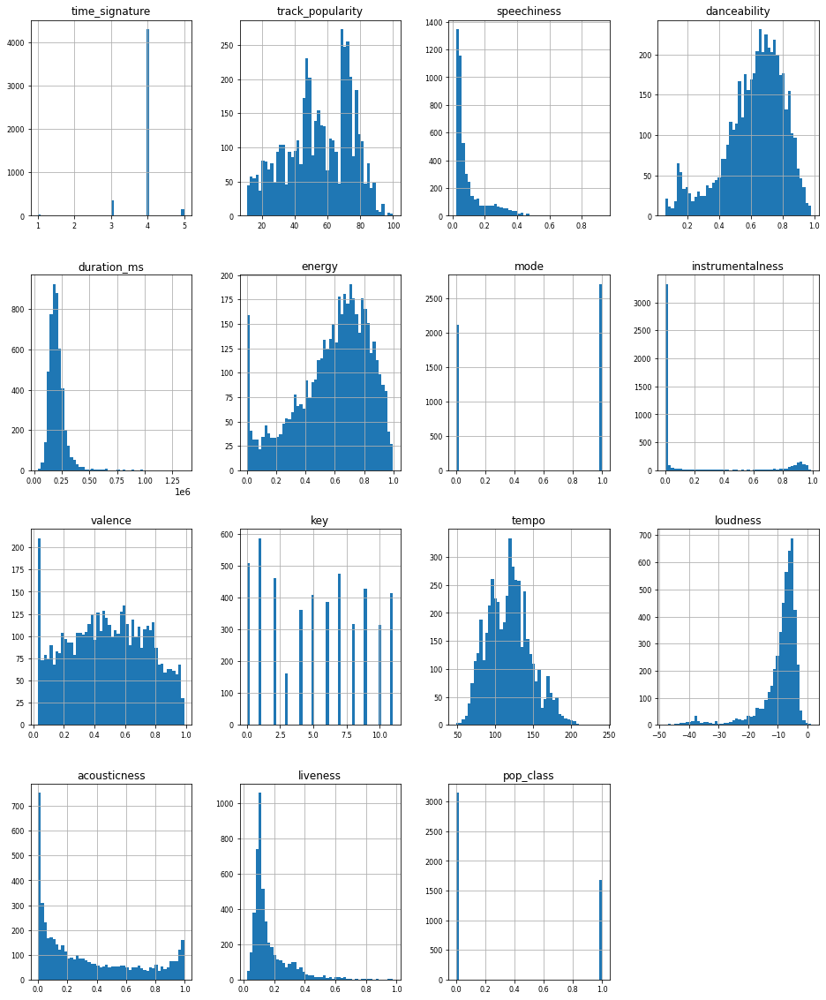

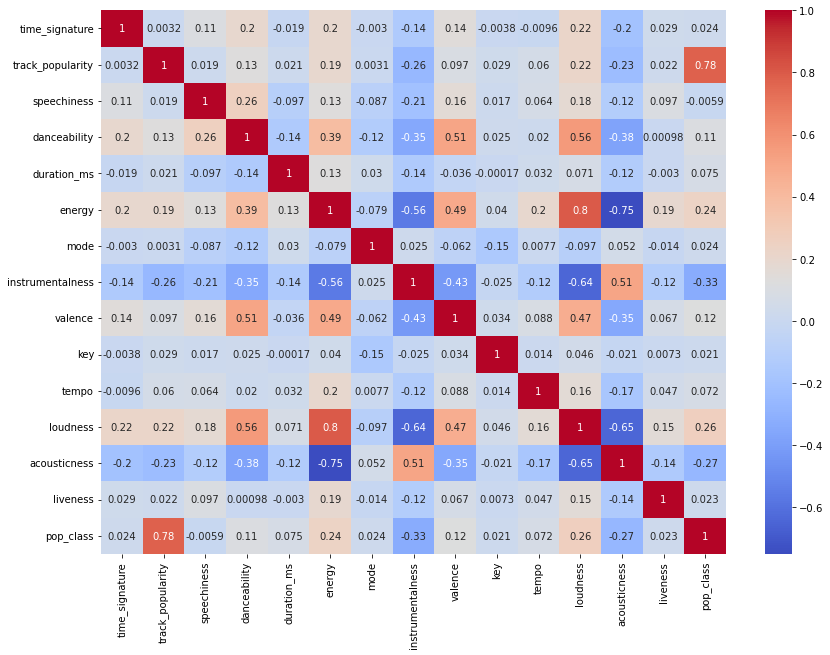

count    4831.000000
mean       54.761126
std        19.828573
min        11.000000
25%        41.000000
50%        56.000000
75%        72.000000
max       100.000000
Name: track_popularity, dtype: float64


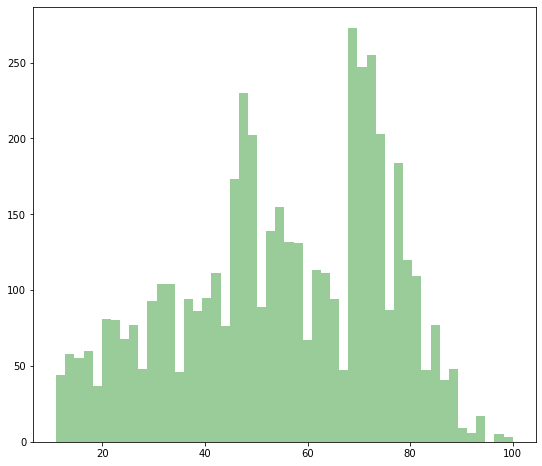

There is 1 strongly correlated values with track_popularity:
pop_class    0.777176
Name: track_popularity, dtype: float64


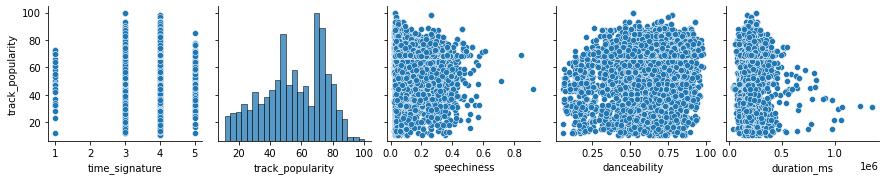

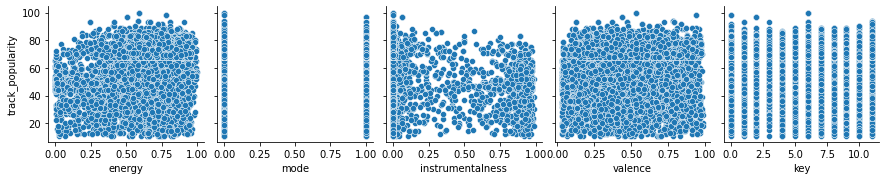

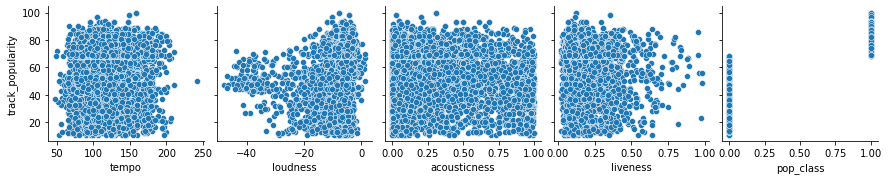

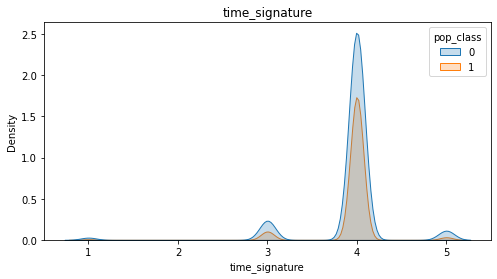

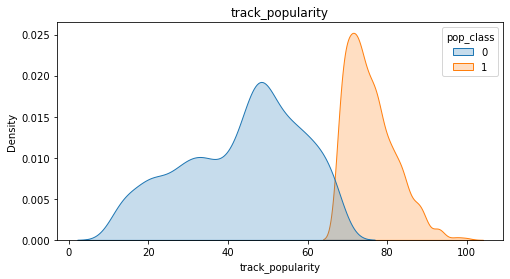

...

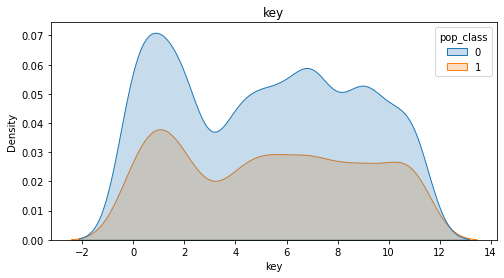

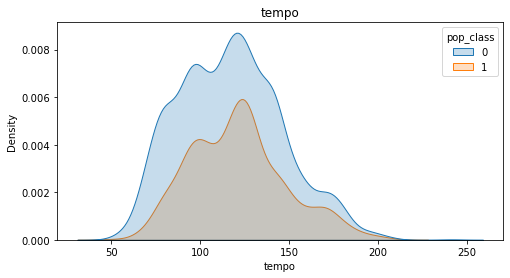

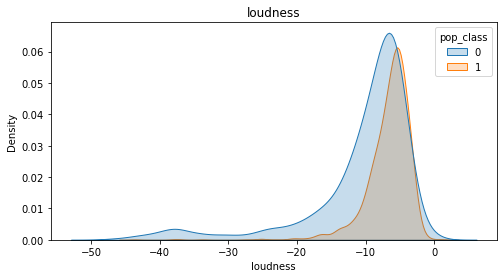

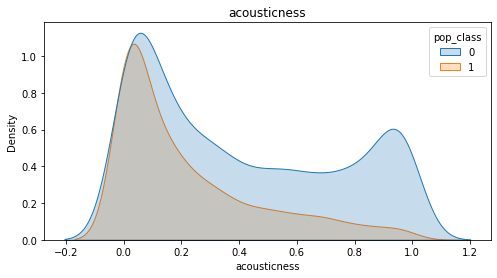

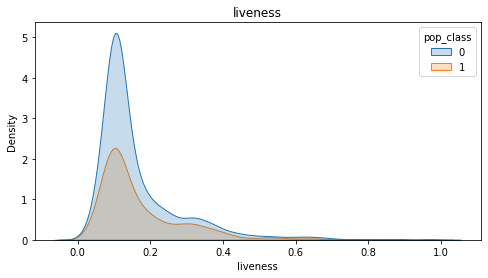

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


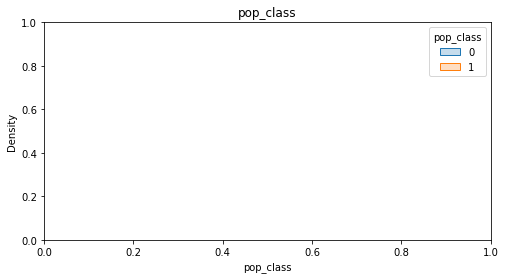

0    0.651004
1    0.348996
Name: pop_class, dtype: float64


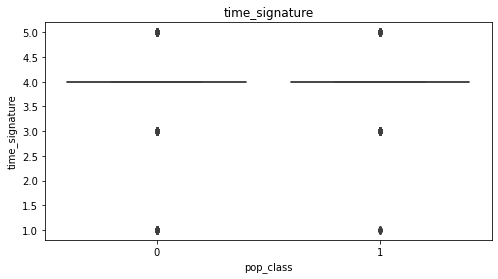

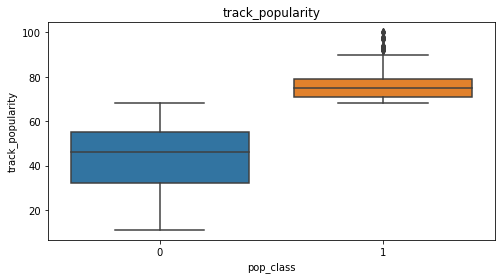

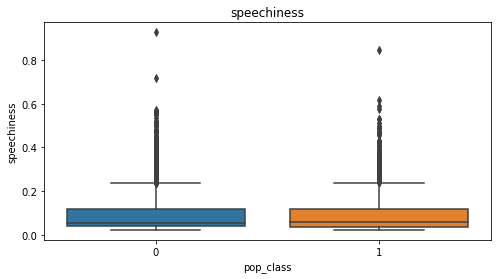

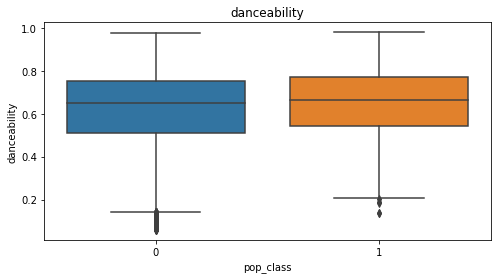

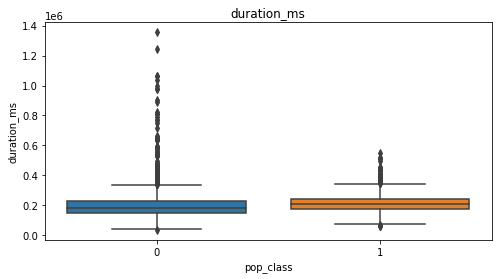

...

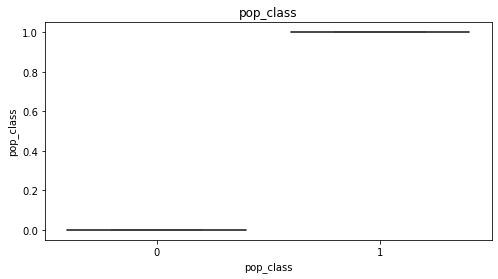

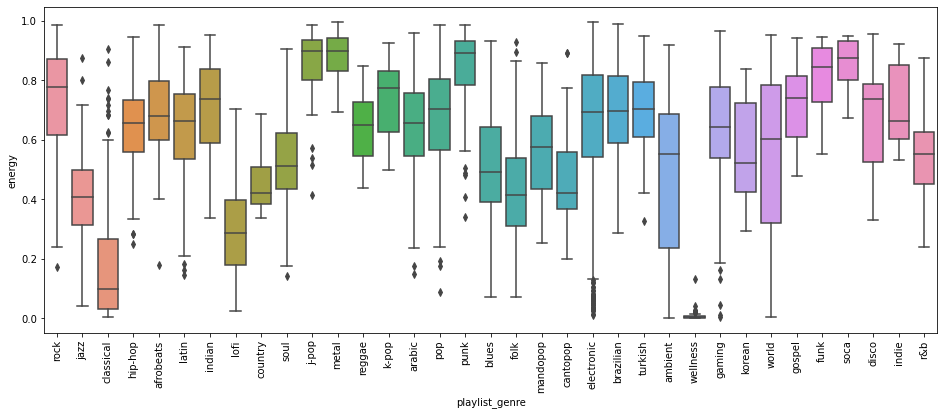

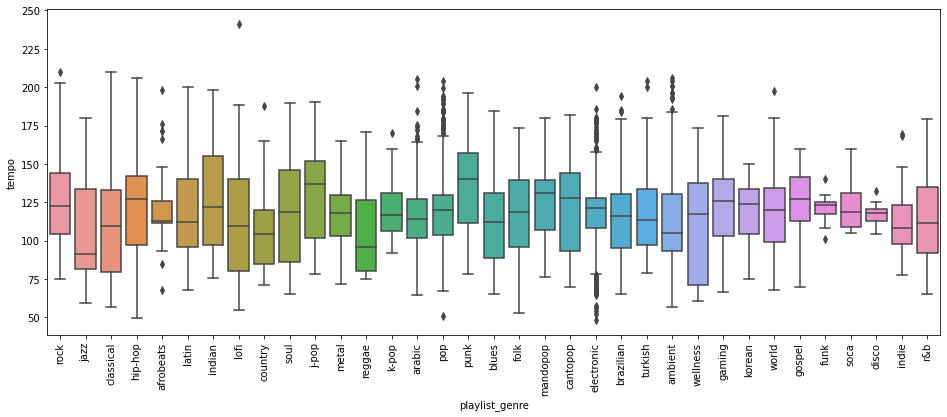

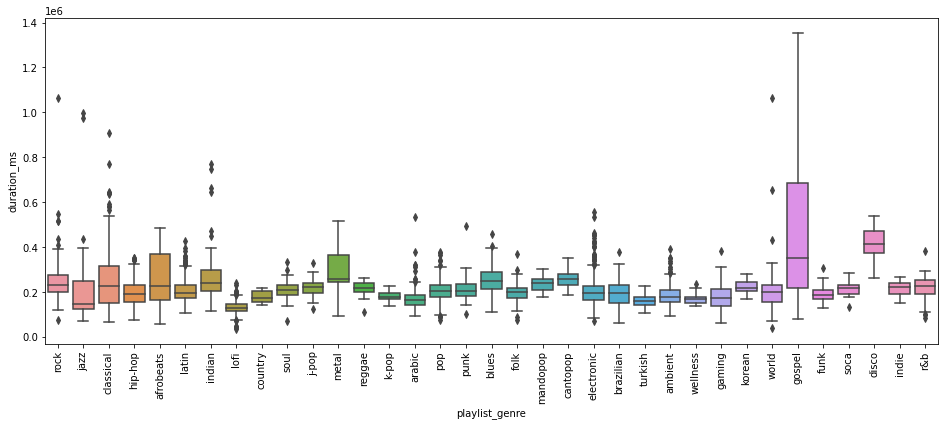

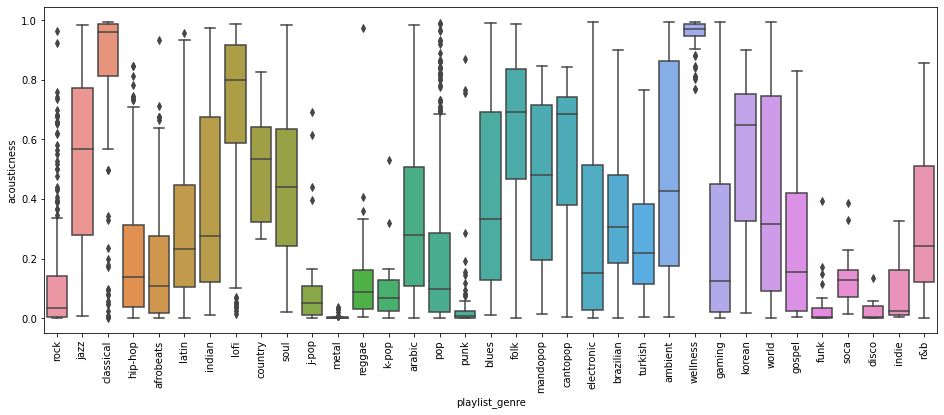

In [1]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, log_loss, confusion_matrix, f1_score, silhouette_score, silhouette_samples
import time
from sklearn.decomposition import PCA
import random
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial import ConvexHull
from matplotlib.patches import Polygon
from ipynb.fs.full.ML_Project_EDA import *


# Feature Engineering

In [3]:
#Dropping the NA values from numeric columns.
num_cols = [
    'energy','danceability','tempo','loudness','valence','acousticness',
    'instrumentalness','speechiness','liveness','duration_ms'
]
df_clust = df.dropna(subset=num_cols)
features = df_clust[num_cols]
#Scaling numerical columns (features).
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)


## Steps Performed
- Removed rows with missing numerical values
    Missing data in audio features can distort clustering structure, so rows containing NA values in num_cols were dropped as there were one or two NAs for some features.
    
- Selected only the numerical features for clustering
    The subset df_clust[num_cols] ensures clustering uses purely quantitative audio descriptors (energy, danceability, tempo, loudness, etc.).
    
- Applied StandardScaler to normalize features
    Because the histograms showed large differences in scale (e.g., tempo vs. valence vs. instrumentalness), all features were standardized to mean 0 and variance 1.
    This prevents features with large numerical ranges from dominating the clustering process.

**After preprocessing, we obtained X_scaled, a standardized numerical matrix that serves as the input for PCA and all unsupervised learning models.**

# Models

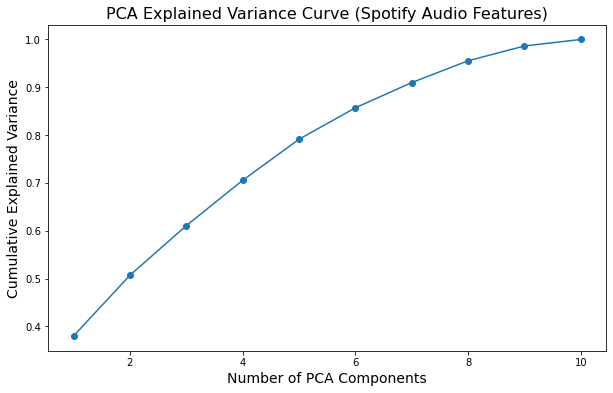

In [4]:
# Fit PCA using all numeric columns
pca = PCA(n_components=len(num_cols), random_state=0)
pca.fit(X_scaled)

# Get cumulative explained variance
explained_variance = np.cumsum(pca.explained_variance_ratio_)

# Number of components for the x-axis
num_components = np.arange(1, len(num_cols) + 1)

# Plot cumulative explained variance
plt.figure(figsize=(10,6))

plt.plot(num_components, explained_variance, marker='o')
plt.xlabel("Number of PCA Components", fontsize=14)
plt.ylabel("Cumulative Explained Variance", fontsize=14)
plt.title("PCA Explained Variance Curve (Spotify Audio Features)", fontsize=16)
plt.show()

Only 2 components already are revealing almost half of data

In [5]:
# PCA with 2 components for visualization
pca = PCA(n_components=2, random_state=0)
X_pca = pca.fit_transform(X_scaled)
loadings = pd.DataFrame(
    pca.components_.T,
    columns=['PC1', 'PC2'],
    index=num_cols
)
loadings


,PC1,PC2
energy,-0.447906,0.179690
danceability,-0.331541,-0.428007
tempo,-0.119207,0.221218
loudness,-0.457142,0.040706
valence,-0.340880,-0.237773
acousticness,0.405470,-0.197747
instrumentalness,0.386156,-0.098522
speechiness,-0.151621,-0.413620
liveness,-0.107792,0.117010
duration_ms,-0.044081,0.666189


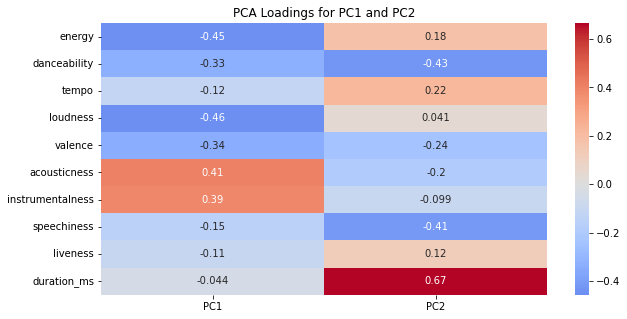

In [6]:
# Heatmap of PCA loadings
plt.figure(figsize=(10,5))
sns.heatmap(loadings, annot=True, cmap="coolwarm", center=0)
plt.title("PCA Loadings for PC1 and PC2")
plt.show()

## PCA Interpretation

After scaling the numerical audio features, PCA was applied to reduce dimensionality and reveal the dominant sources of variation in the dataset. The heatmap of PCA loadings shows how each original feature contributes to the first two principal components (PC1 and PC2), which together capture a substantial portion of the variance.

**PC1 is primarily driven by:**
- High positive loadings:
    - Acousticness 
    - Instrumentalness 
- Strong negative loadings:
    - Loudness 
    - Energy 

PC1 separates tracks based on mainly acoustic, instrumental and loud, energetic, high-valence features.

**PC2 primarily driven by:**
- High positive loading:
    - Duration 
- Strong negative loadings:
    - Danceability 
    - Speechiness

PC2 separates tracks based on mainly duation and musical density features.

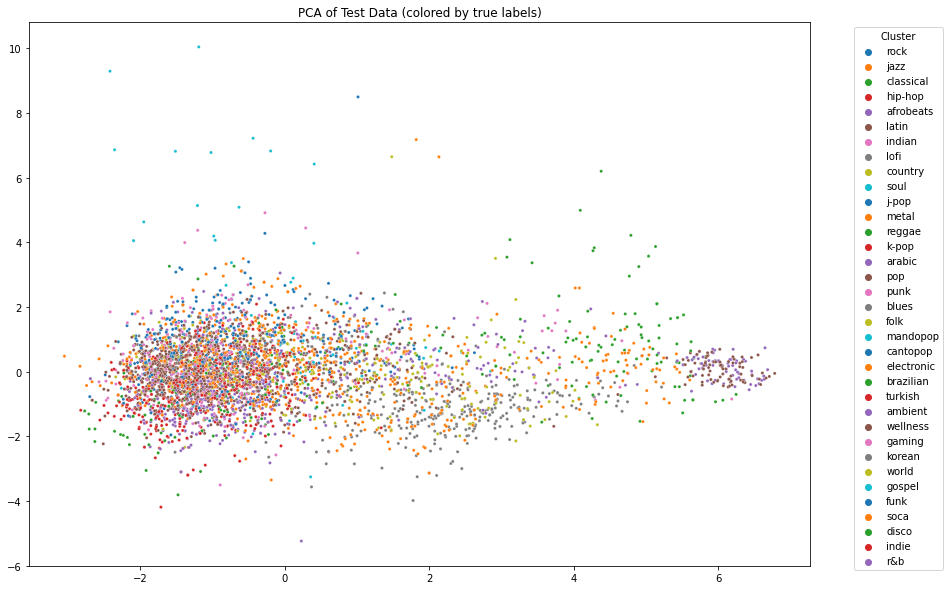

In [7]:
# Scatter plot of PCA components colored by true labels.
plt.figure(figsize=(14, 10))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=df_clust['playlist_genre'], palette='tab10', s=10, legend='full')
plt.title("PCA of Test Data (colored by true labels)") 
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.show()

The genres are pretty much merged into one another.

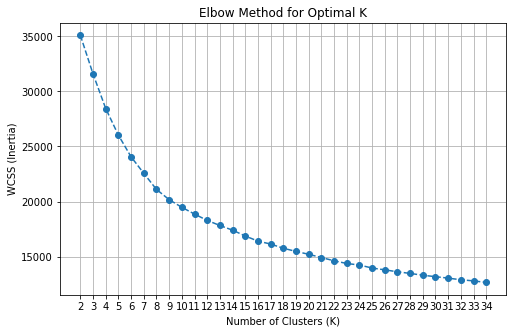

In [8]:
# Compute WCSS for different K values
wcss = []
K_range = range(2, 35)

for k in K_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=42)
    # fit KMeans
    kmeans.fit(X_scaled)
    # store inertia
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(K_range, wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('WCSS (Inertia)')
plt.xticks(K_range)
plt.grid(True)
plt.show()

Starting from almost 7 clusters the inertia is starting to not change a lot and from almost 3 clusters the inertia begins to change a lot slower.

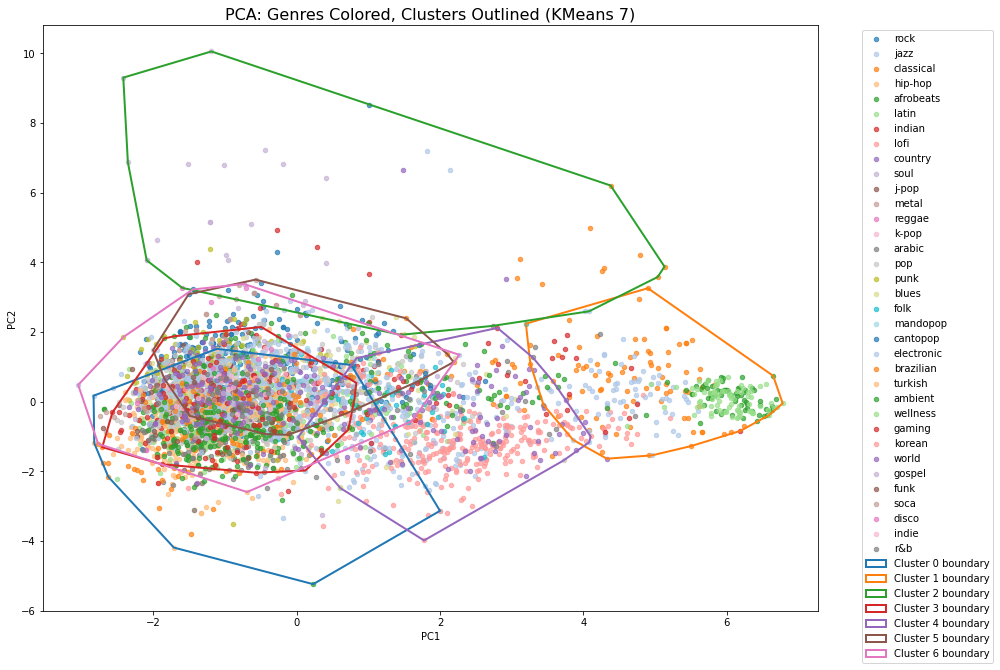

In [9]:
# Fit KMeans with 7 clusters
kmeans_7 = KMeans(n_clusters=7, random_state=42)
clusters_7 = kmeans_7.fit_predict(X_scaled)
# Build plotting dataframe
plot_df = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "cluster": clusters_7,              
    "genre": df_clust["playlist_genre"]
})

# Colors for genres
genres = plot_df["genre"].unique()
genre_palette = sns.color_palette("tab20", len(genres))
genre_color_map = {g: genre_palette[i] for i, g in enumerate(genres)}

# Scatter plot by genre
fig, ax = plt.subplots(figsize=(14, 10))

for g in genres:
    sub = plot_df[plot_df["genre"] == g]
    ax.scatter(
        sub["PC1"], sub["PC2"],
        s=20,
        color=genre_color_map[g],
        alpha=0.7,
        label=g
    )

# Colors for cluster boundaries
n_clusters = len(np.unique(plot_df["cluster"]))
cluster_colors = sns.color_palette("tab10", n_clusters)

# Draw borders around each cluster
for c in range(n_clusters):
    pts = plot_df[plot_df["cluster"] == c][["PC1", "PC2"]].values
    if pts.shape[0] < 3:
        continue  

    hull = ConvexHull(pts)
    hull_pts = pts[hull.vertices]

    poly = Polygon(
        hull_pts,
        closed=True,
        fill=False,
        edgecolor=cluster_colors[c],
        linewidth=2.0,
        label=f"Cluster {c} boundary"
    )
    ax.add_patch(poly)

# Title, labels and legend
ax.set_title("PCA: Genres Colored, Clusters Outlined (KMeans 7)", fontsize=16)
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", ncol=1)
plt.tight_layout()
plt.show()

## Interpretation of PCA Clustering Visualization (K-Means, 7 Clusters)

- Tracks inside a cluster are not very similar to each other.
- There is substantial overlap between clusters.
- The audio features do not strongly separate genres into clean groups.

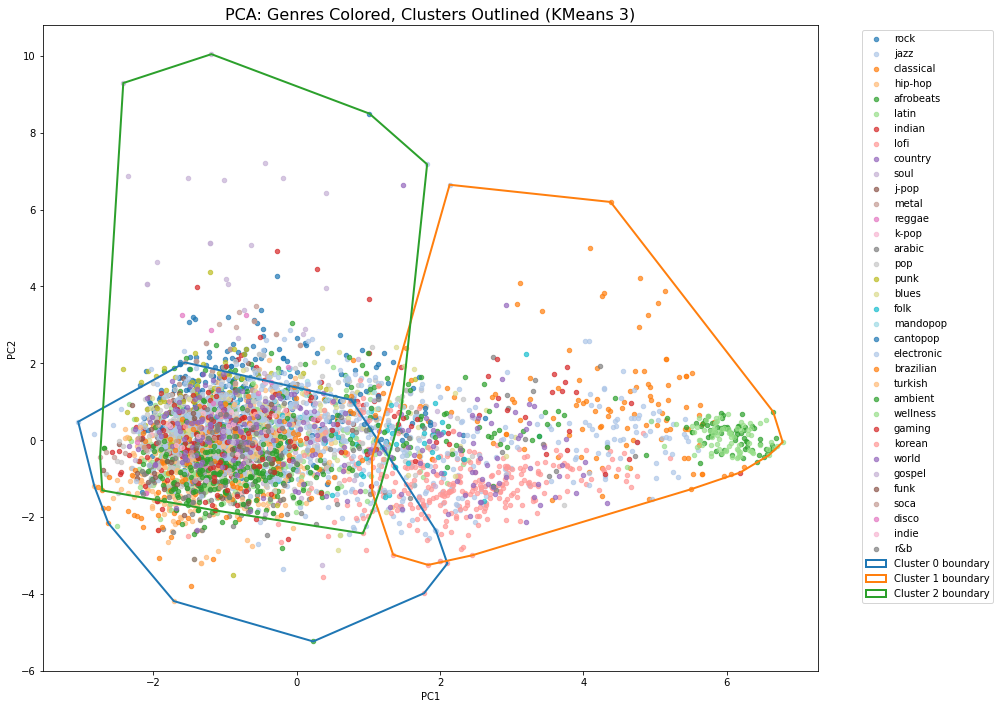

In [10]:
# KMeans with 3 clusters plotting in the same way
kmeans_3 = KMeans(n_clusters=3, random_state=42)
clusters_3 = kmeans_3.fit_predict(X_scaled)

plot_df = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "cluster": clusters_3,                
    "genre": df_clust["playlist_genre"]
})

genres = plot_df["genre"].unique()
genre_palette = sns.color_palette("tab20", len(genres))
genre_color_map = {g: genre_palette[i] for i, g in enumerate(genres)}

fig, ax = plt.subplots(figsize=(14, 10))

for g in genres:
    sub = plot_df[plot_df["genre"] == g]
    ax.scatter(
        sub["PC1"], sub["PC2"],
        s=20,
        color=genre_color_map[g],
        alpha=0.7,
        label=g
    )

n_clusters = len(np.unique(plot_df["cluster"]))
cluster_colors = sns.color_palette("tab10", n_clusters)

for c in range(n_clusters):
    pts = plot_df[plot_df["cluster"] == c][["PC1", "PC2"]].values
    if pts.shape[0] < 3:
        continue  
    hull = ConvexHull(pts)
    hull_pts = pts[hull.vertices]

    poly = Polygon(
        hull_pts,
        closed=True,
        fill=False,
        edgecolor=cluster_colors[c],
        linewidth=2.0,
        label=f"Cluster {c} boundary"
    )
    ax.add_patch(poly)

ax.set_title("PCA: Genres Colored, Clusters Outlined (KMeans 3)", fontsize=16)
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", ncol=1)
plt.tight_layout()
plt.show()

## Interpretation of PCA Clustering Visualization (K-Means, 3 Clusters)

Positive:
- Tracks within each cluster are more similar than before.
- Clusters are better separated in PCA space (less merged).
 
Negative: 
- Each cluster contains a wide variety of genres.
- Tracks labeled under the same genre often scatter across multiple clusters.

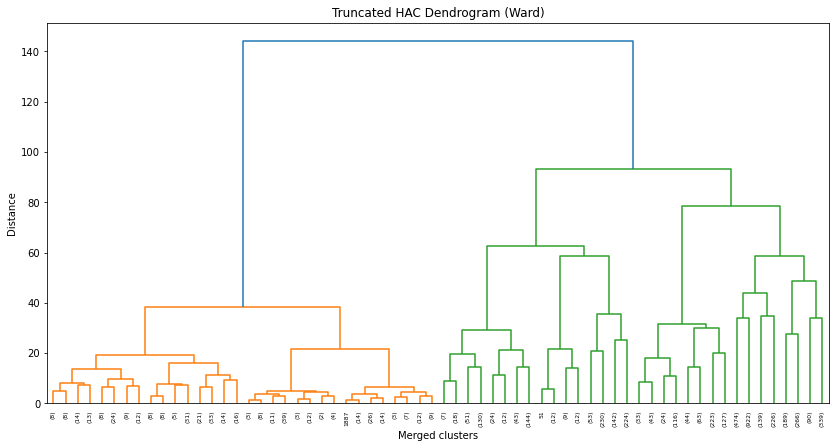

In [11]:
# HAC linkage using Ward
Z = linkage(X_scaled, method='ward')
# Plot truncated dendrogram
plt.figure(figsize=(14, 7))
dendrogram(
    Z,
    # show top 5 levels
    truncate_mode='level',
    p=5,
    leaf_rotation=90
)
plt.title("Truncated HAC Dendrogram (Ward)")
plt.xlabel("Merged clusters")
plt.ylabel("Distance")
plt.show()

## Interpreting the HAC Dendrogram

- The dendrogram shows two major branches merging at the highest distance (~145), indicating that the dataset naturally separates into a very small number of broad groups.
- Below the top merge, we see three medium-sized branches, which supports the choice of 3 clusters: the main structure of the dataset is captured by three large acoustic families.
- At lower distances, each of the medium branches divides into several subclusters. This motivates the secondary choice of 7 clusters, which attempts to capture finer-grained variation within the broader groups.

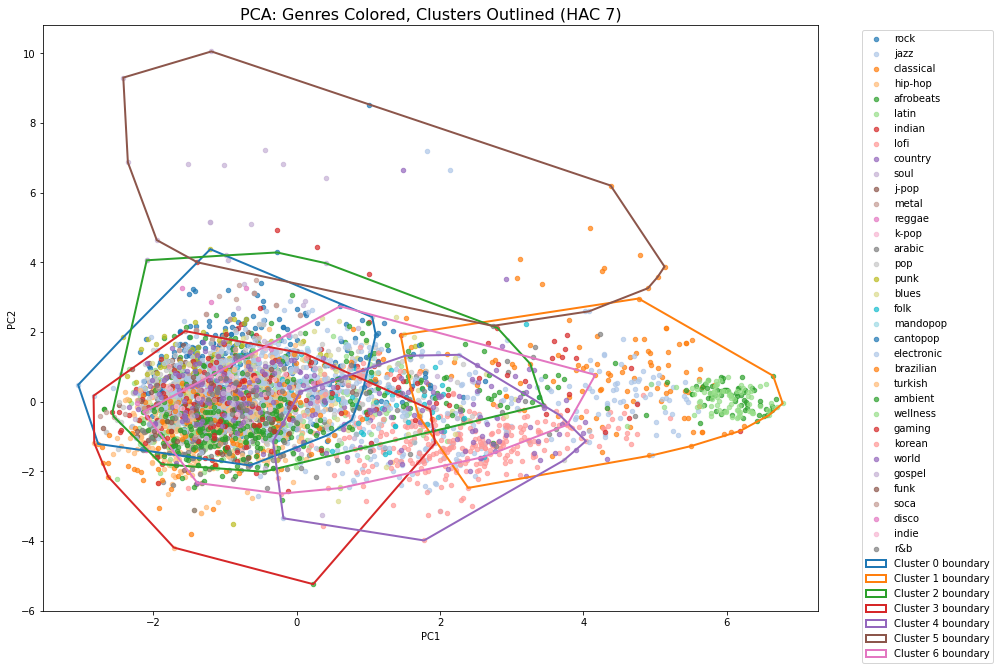

In [12]:
# HAC with 7 clusters plotting in the same way
hac_7 = AgglomerativeClustering(n_clusters=7, linkage='ward')
hac_clusters_7 = hac_7.fit_predict(X_scaled)
plot_df = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "cluster": hac_clusters_7,              
    "genre": df_clust["playlist_genre"]
})

genres = plot_df["genre"].unique()
genre_palette = sns.color_palette("tab20", len(genres))
genre_color_map = {g: genre_palette[i] for i, g in enumerate(genres)}

fig, ax = plt.subplots(figsize=(14, 10))

for g in genres:
    sub = plot_df[plot_df["genre"] == g]
    ax.scatter(
        sub["PC1"], sub["PC2"],
        s=20,
        color=genre_color_map[g],
        alpha=0.7,
        label=g
    )

n_clusters = len(np.unique(plot_df["cluster"]))
cluster_colors = sns.color_palette("tab10", n_clusters)

for c in range(n_clusters):
    pts = plot_df[plot_df["cluster"] == c][["PC1", "PC2"]].values
    if pts.shape[0] < 3:
        continue  

    hull = ConvexHull(pts)
    hull_pts = pts[hull.vertices]

    poly = Polygon(
        hull_pts,
        closed=True,
        fill=False,
        edgecolor=cluster_colors[c],
        linewidth=2.0,
        label=f"Cluster {c} boundary"
    )
    ax.add_patch(poly)

ax.set_title("PCA: Genres Colored, Clusters Outlined (HAC 7)", fontsize=16)
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", ncol=1)
plt.tight_layout()
plt.show()

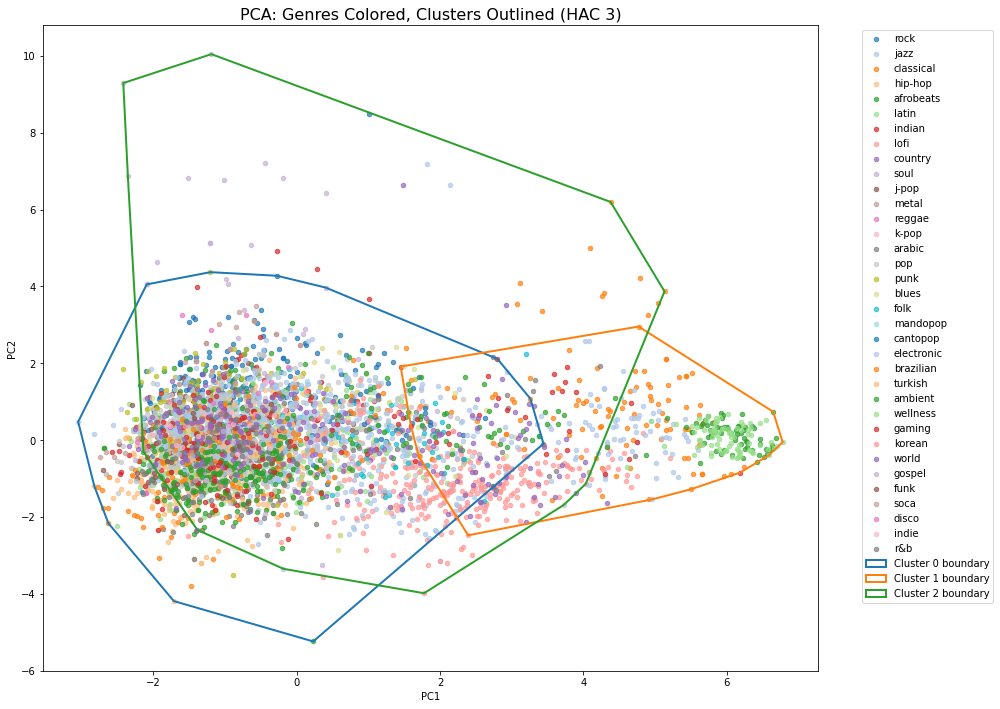

In [13]:
# HAC with 3 clusters plotting in the same way
hac_3 = AgglomerativeClustering(n_clusters=3, linkage='ward')
hac_clusters_3 = hac_3.fit_predict(X_scaled)
plot_df = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "cluster": hac_clusters_3,                
    "genre": df_clust["playlist_genre"]
})

genres = plot_df["genre"].unique()
genre_palette = sns.color_palette("tab20", len(genres))
genre_color_map = {g: genre_palette[i] for i, g in enumerate(genres)}

fig, ax = plt.subplots(figsize=(14, 10))

for g in genres:
    sub = plot_df[plot_df["genre"] == g]
    ax.scatter(
        sub["PC1"], sub["PC2"],
        s=20,
        color=genre_color_map[g],
        alpha=0.7,
        label=g
    )

n_clusters = len(np.unique(plot_df["cluster"]))
cluster_colors = sns.color_palette("tab10", n_clusters)

for c in range(n_clusters):
    pts = plot_df[plot_df["cluster"] == c][["PC1", "PC2"]].values
    if pts.shape[0] < 3:
        continue  

    hull = ConvexHull(pts)
    hull_pts = pts[hull.vertices]

    poly = Polygon(
        hull_pts,
        closed=True,
        fill=False,
        edgecolor=cluster_colors[c],
        linewidth=2.0,
        label=f"Cluster {c} boundary"
    )
    ax.add_patch(poly)

ax.set_title("PCA: Genres Colored, Clusters Outlined (HAC 3)", fontsize=16)
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", ncol=1)
plt.tight_layout()
plt.show()

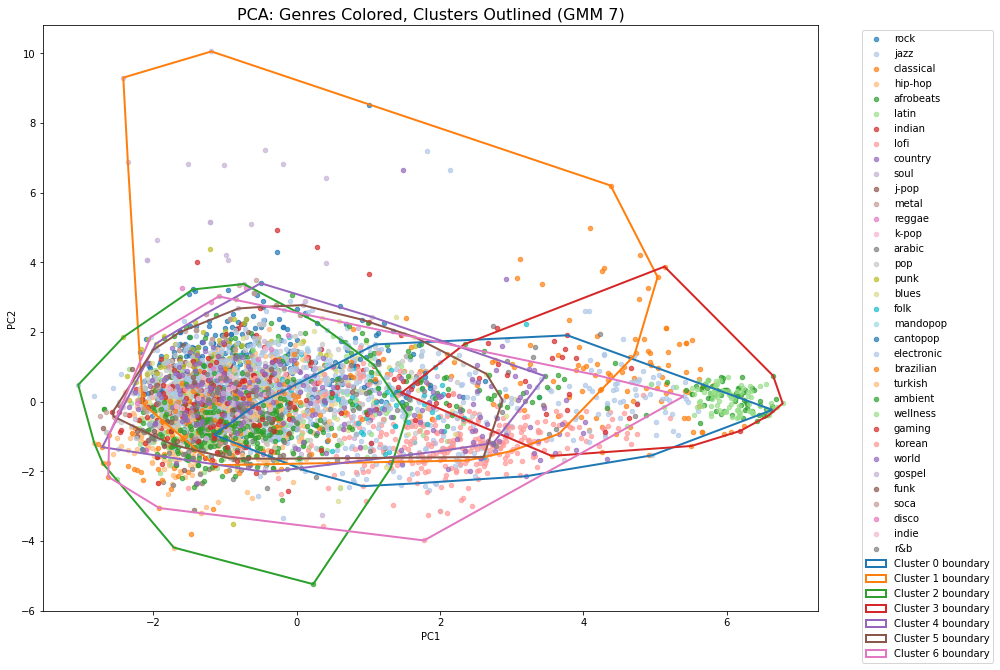

In [14]:
# GMM with 7 clusters plotting in the same way
gmm_7 = GaussianMixture(n_components=7, covariance_type='full', random_state=42)
gmm_clusters_7 = gmm_7.fit_predict(X_scaled)

plot_df = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "cluster": gmm_clusters_7,              
    "genre": df_clust["playlist_genre"]
})

genres = plot_df["genre"].unique()
genre_palette = sns.color_palette("tab20", len(genres))
genre_color_map = {g: genre_palette[i] for i, g in enumerate(genres)}

fig, ax = plt.subplots(figsize=(14, 10))

for g in genres:
    sub = plot_df[plot_df["genre"] == g]
    ax.scatter(
        sub["PC1"], sub["PC2"],
        s=20,
        color=genre_color_map[g],
        alpha=0.7,
        label=g
    )

n_clusters = len(np.unique(plot_df["cluster"]))
cluster_colors = sns.color_palette("tab10", n_clusters)

for c in range(n_clusters):
    pts = plot_df[plot_df["cluster"] == c][["PC1", "PC2"]].values
    if pts.shape[0] < 3:
        continue  

    hull = ConvexHull(pts)
    hull_pts = pts[hull.vertices]

    poly = Polygon(
        hull_pts,
        closed=True,
        fill=False,
        edgecolor=cluster_colors[c],
        linewidth=2.0,
        label=f"Cluster {c} boundary"
    )
    ax.add_patch(poly)

ax.set_title("PCA: Genres Colored, Clusters Outlined (GMM 7)", fontsize=16)
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", ncol=1)
plt.tight_layout()
plt.show()

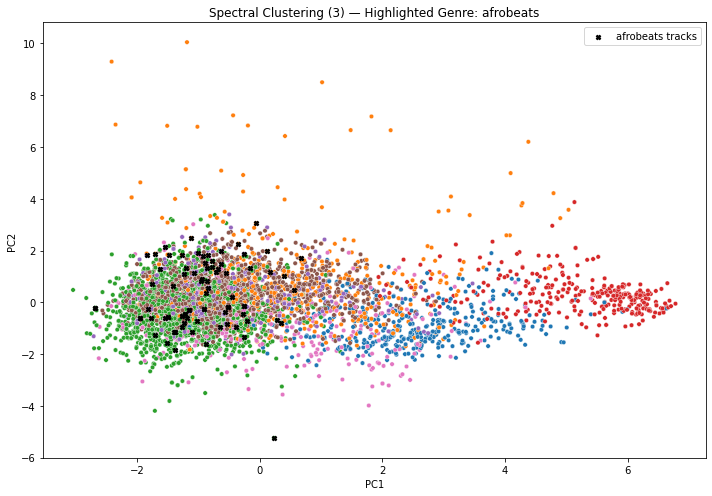

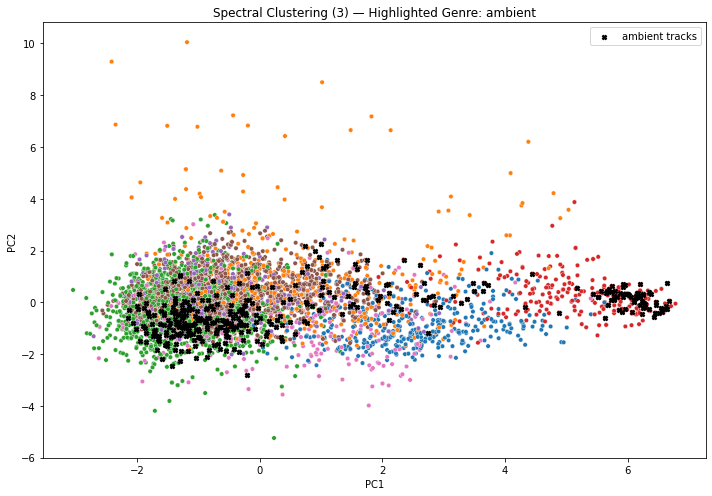

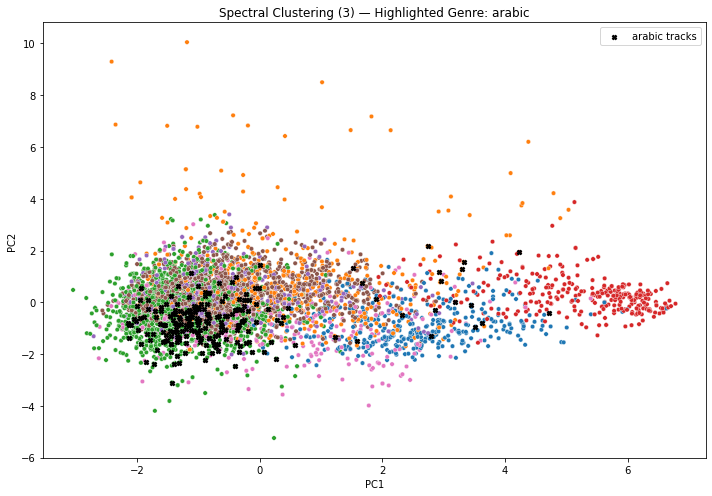

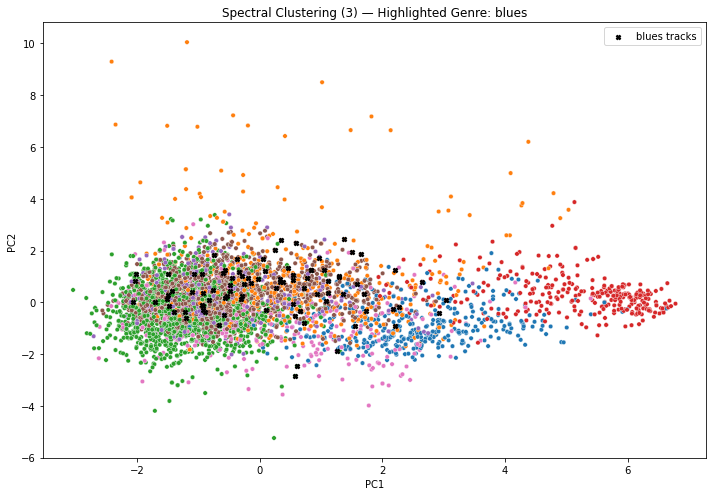

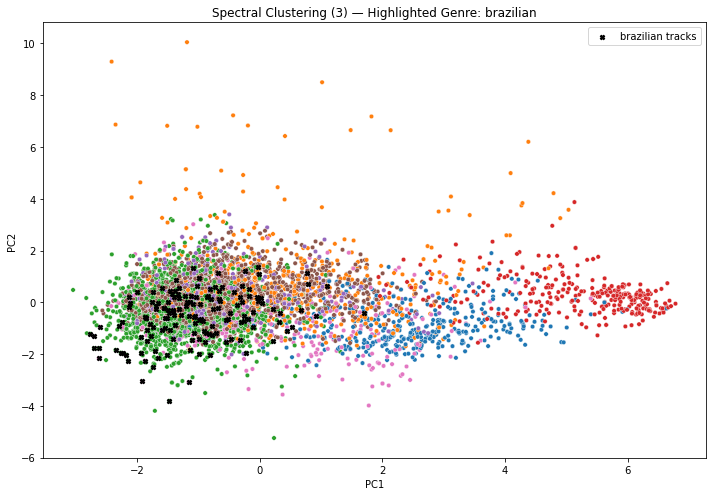

...

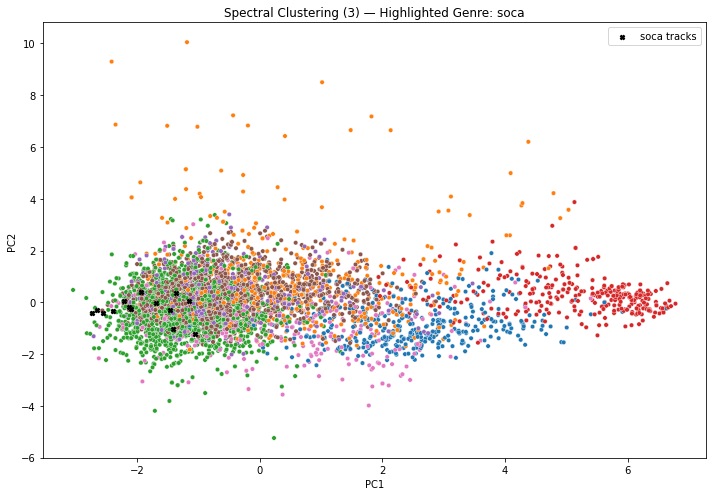

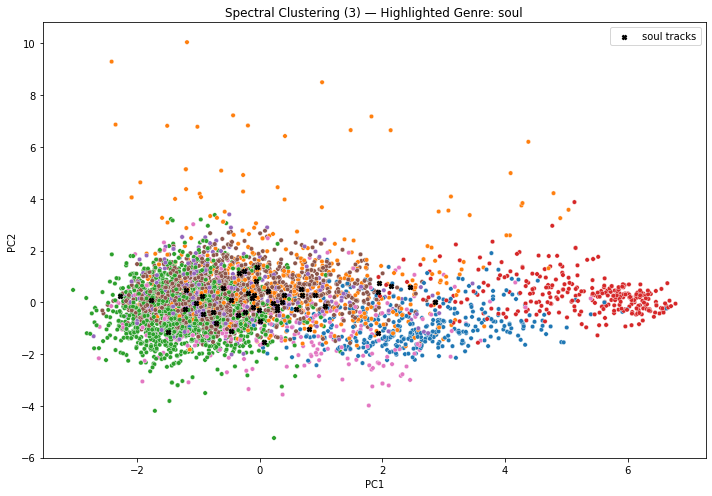

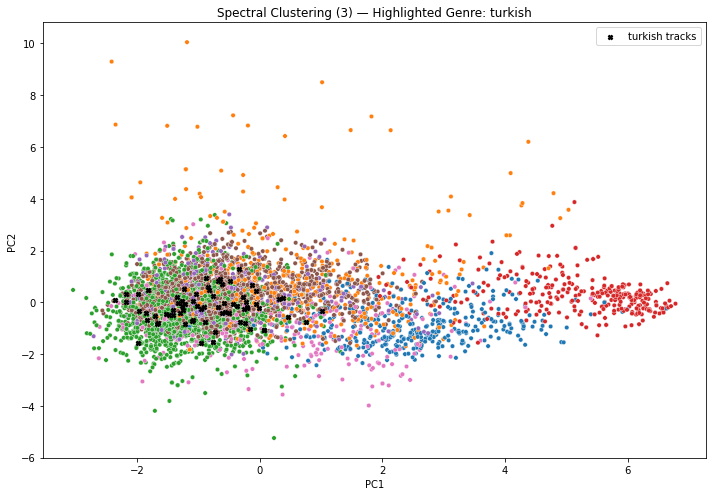

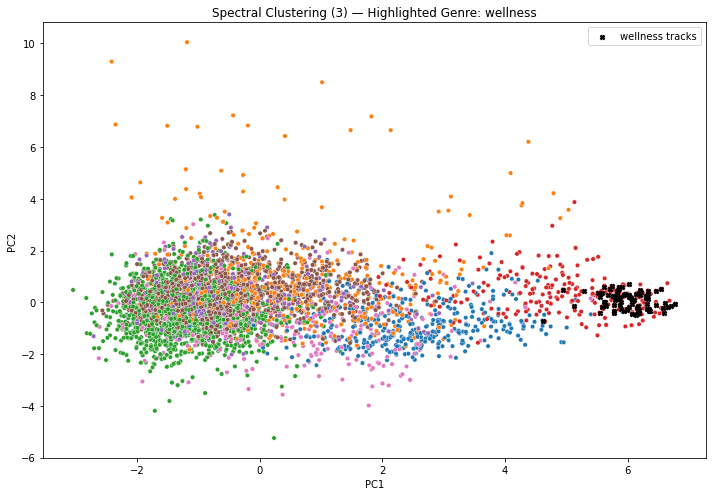

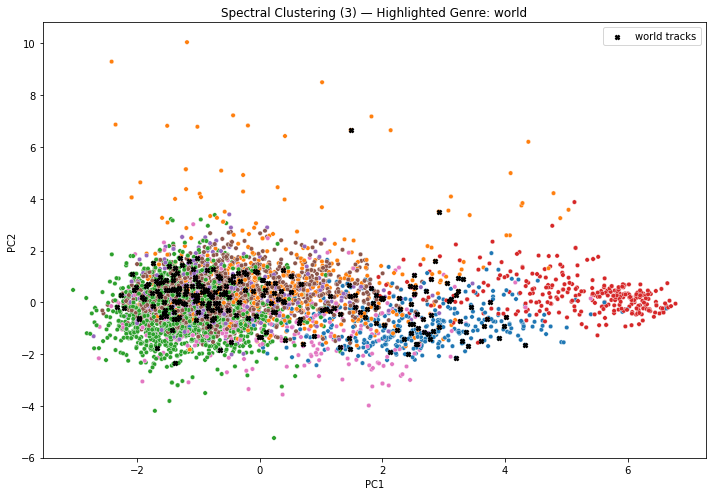

In [15]:
# DataFrame for easy plotting
plot_df = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "cluster": gmm_clusters_7,
    "genre": df_clust["playlist_genre"]
})

genres = sorted(plot_df["genre"].unique())

# Colors for clusters
cluster_palette = sns.color_palette("tab10", len(np.unique(gmm_clusters_7)))

#For each genre plotting the clusters and on them that specific genre points differently.
for g in genres:
    plt.figure(figsize=(10, 7))

    # Plot all points colored by cluster
    sns.scatterplot(
        data=plot_df,
        x="PC1",
        y="PC2",
        hue="cluster",
        palette=cluster_palette,
        s=20,
        legend=False
    )

    # Highlight only the corresponding genre with a special marker
    genre_points = plot_df[plot_df["genre"] == g]
    plt.scatter(
        genre_points["PC1"],
        genre_points["PC2"],
        color="black",
        s=20,
        marker="X",
        label=f"{g} tracks"
    )

    plt.title(f"Spectral Clustering (3) — Highlighted Genre: {g}")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.legend()
    plt.tight_layout()
    plt.show()

## Interpretation of GMM (7 Clusters)

- Extensive overlap between clusters:
    The Gaussian components stretch across the entire PCA space, creating flexible but poorly defined cluster shapes. This results in clusters that occupy almost identical regions.
    
- No clear separation in the data:
    The audio features do not form elliptical or compact cluster shapes—yet GMM assumes each cluster follows a Gaussian distribution.Because this assumption is violated, GMM overfits noise instead of capturing true structure.
    
- Genres are densely mixed:
    The plot shows that nearly every genre appears inside every cluster boundary. This indicates that GMM is not discovering meaningful musical groupings.

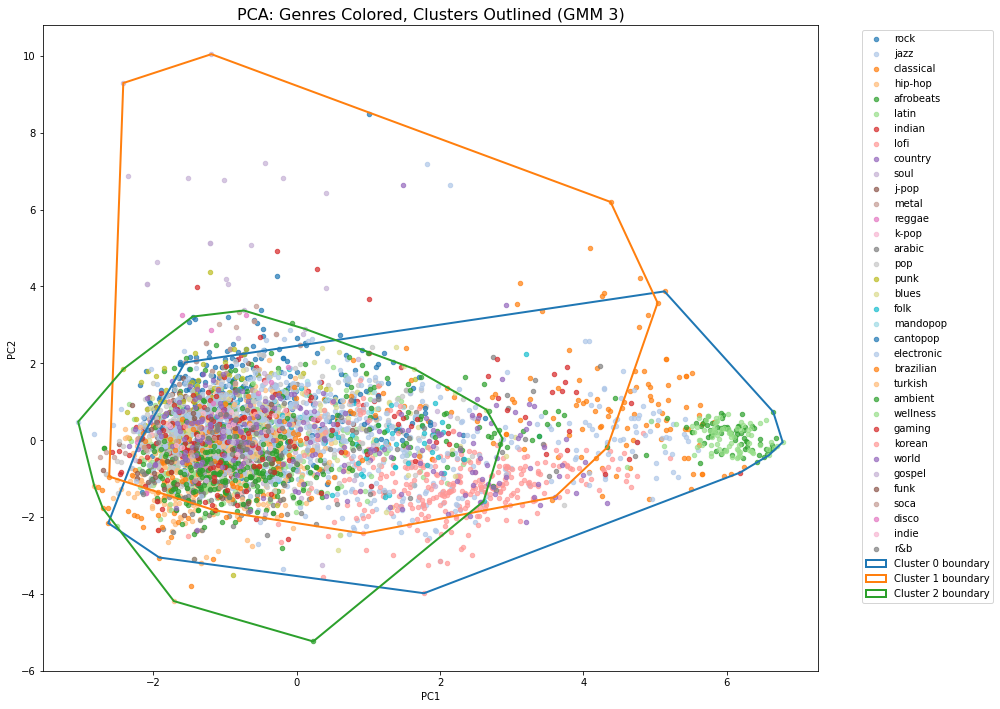

In [16]:
# GMM with 3 clusters plotting in the same way
gmm_3 = GaussianMixture(n_components=3, covariance_type='full', random_state=42)
gmm_clusters_3 = gmm_3.fit_predict(X_scaled)

plot_df = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "cluster": gmm_clusters_3,              
    "genre": df_clust["playlist_genre"]
})

genres = plot_df["genre"].unique()
genre_palette = sns.color_palette("tab20", len(genres))
genre_color_map = {g: genre_palette[i] for i, g in enumerate(genres)}

fig, ax = plt.subplots(figsize=(14, 10))

for g in genres:
    sub = plot_df[plot_df["genre"] == g]
    ax.scatter(
        sub["PC1"], sub["PC2"],
        s=20,
        color=genre_color_map[g],
        alpha=0.7,
        label=g
    )

n_clusters = len(np.unique(plot_df["cluster"]))
cluster_colors = sns.color_palette("tab10", n_clusters)

for c in range(n_clusters):
    pts = plot_df[plot_df["cluster"] == c][["PC1", "PC2"]].values
    if pts.shape[0] < 3:
        continue  

    hull = ConvexHull(pts)
    hull_pts = pts[hull.vertices]

    poly = Polygon(
        hull_pts,
        closed=True,
        fill=False,
        edgecolor=cluster_colors[c],
        linewidth=2.0,
        label=f"Cluster {c} boundary"
    )
    ax.add_patch(poly)

ax.set_title("PCA: Genres Colored, Clusters Outlined (GMM 3)", fontsize=16)
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", ncol=1)
plt.tight_layout()
plt.show()

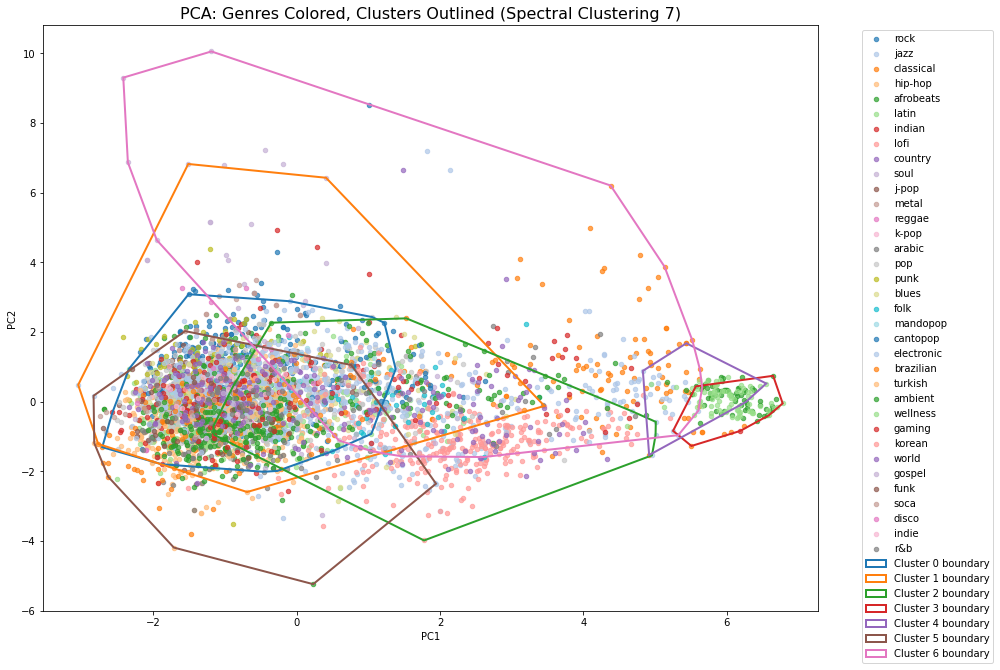

In [17]:
# Spectral Clustering with 7 clusters plotting in the same way
spectral_7 = SpectralClustering(n_clusters=7, affinity='nearest_neighbors', random_state=42)
spec_clusters_7 = spectral_7.fit_predict(X_scaled)

plot_df = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "cluster": spec_clusters_7,               
    "genre": df_clust["playlist_genre"]
})

genres = plot_df["genre"].unique()
genre_palette = sns.color_palette("tab20", len(genres))
genre_color_map = {g: genre_palette[i] for i, g in enumerate(genres)}

fig, ax = plt.subplots(figsize=(14, 10))

for g in genres:
    sub = plot_df[plot_df["genre"] == g]
    ax.scatter(
        sub["PC1"], sub["PC2"],
        s=20,
        color=genre_color_map[g],
        alpha=0.7,
        label=g
    )

n_clusters = len(np.unique(plot_df["cluster"]))
cluster_colors = sns.color_palette("tab10", n_clusters)

for c in range(n_clusters):
    pts = plot_df[plot_df["cluster"] == c][["PC1", "PC2"]].values
    if pts.shape[0] < 3:
        continue  

    hull = ConvexHull(pts)
    hull_pts = pts[hull.vertices]

    poly = Polygon(
        hull_pts,
        closed=True,
        fill=False,
        edgecolor=cluster_colors[c],
        linewidth=2.0,
        label=f"Cluster {c} boundary"
    )
    ax.add_patch(poly)

ax.set_title("PCA: Genres Colored, Clusters Outlined (Spectral Clustering 7)", fontsize=16)
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", ncol=1)
plt.tight_layout()
plt.show()

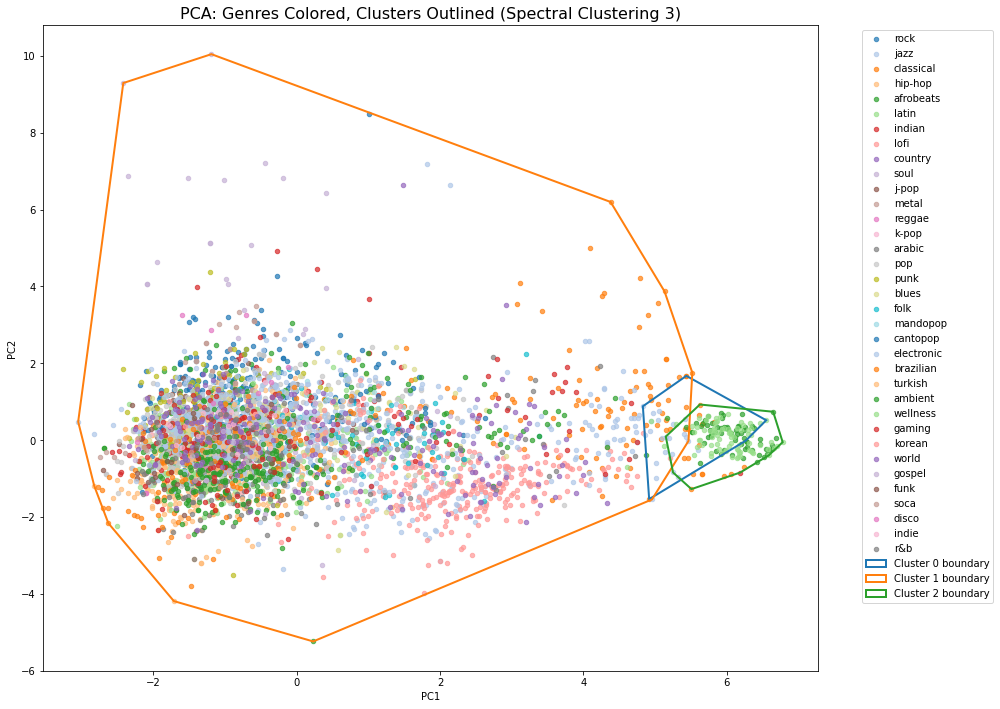

In [18]:
# Spectral Clustering with 3 clusters plotting in the same way
spectral_3 = SpectralClustering(n_clusters=3, affinity='nearest_neighbors', random_state=42)
spec_clusters_3 = spectral_3.fit_predict(X_scaled)

plot_df = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "cluster": spec_clusters_3,                 
    "genre": df_clust["playlist_genre"]
})

genres = plot_df["genre"].unique()
genre_palette = sns.color_palette("tab20", len(genres))
genre_color_map = {g: genre_palette[i] for i, g in enumerate(genres)}

fig, ax = plt.subplots(figsize=(14, 10))

for g in genres:
    sub = plot_df[plot_df["genre"] == g]
    ax.scatter(
        sub["PC1"], sub["PC2"],
        s=20,
        color=genre_color_map[g],
        alpha=0.7,
        label=g
    )

n_clusters = len(np.unique(plot_df["cluster"]))
cluster_colors = sns.color_palette("tab10", n_clusters)

for c in range(n_clusters):
    pts = plot_df[plot_df["cluster"] == c][["PC1", "PC2"]].values
    if pts.shape[0] < 3:
        continue  

    hull = ConvexHull(pts)
    hull_pts = pts[hull.vertices]

    poly = Polygon(
        hull_pts,
        closed=True,
        fill=False,
        edgecolor=cluster_colors[c],
        linewidth=2.0,
        label=f"Cluster {c} boundary"
    )
    ax.add_patch(poly)

ax.set_title("PCA: Genres Colored, Clusters Outlined (Spectral Clustering 3)", fontsize=16)
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", ncol=1)
plt.tight_layout()
plt.show()

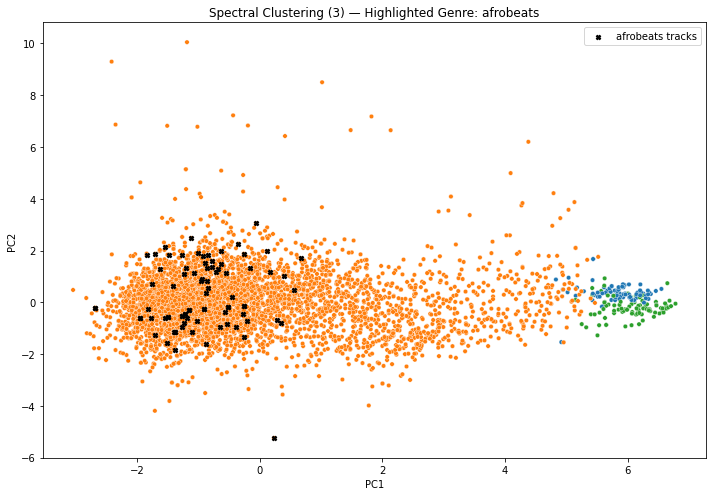

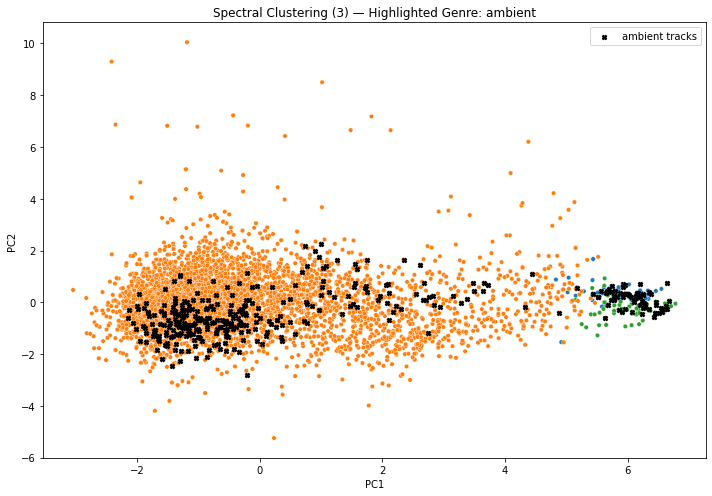

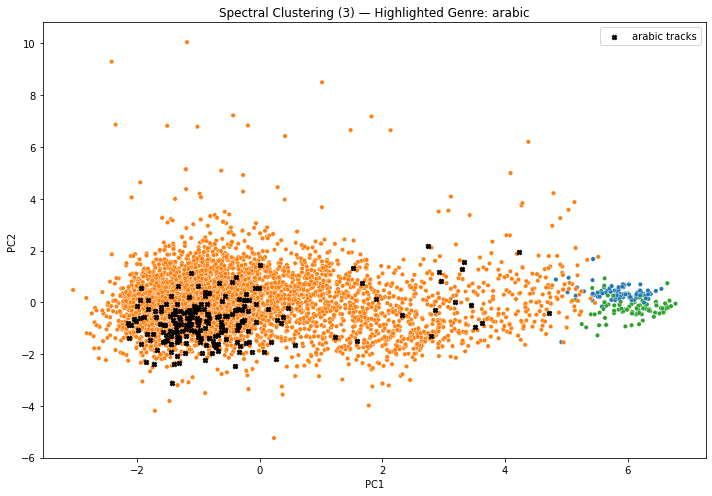

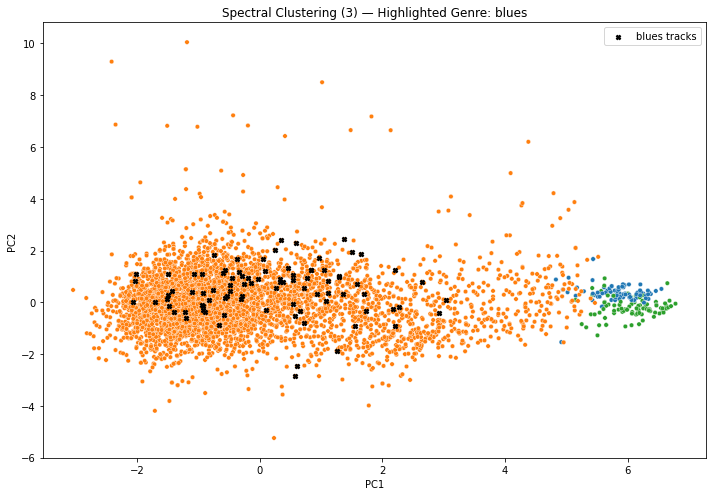

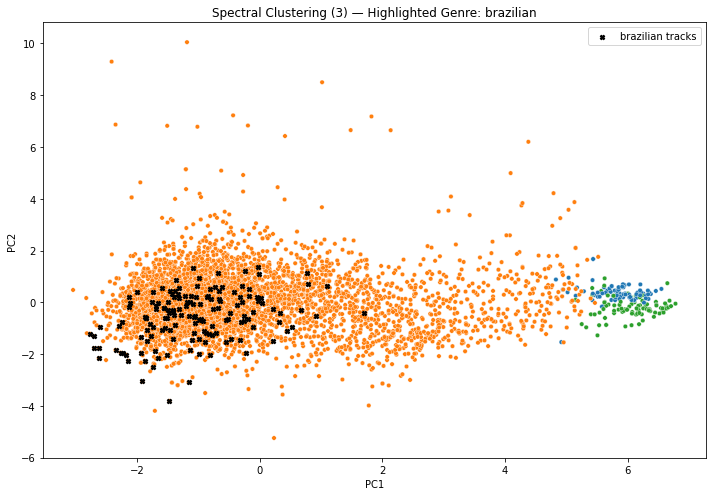

...

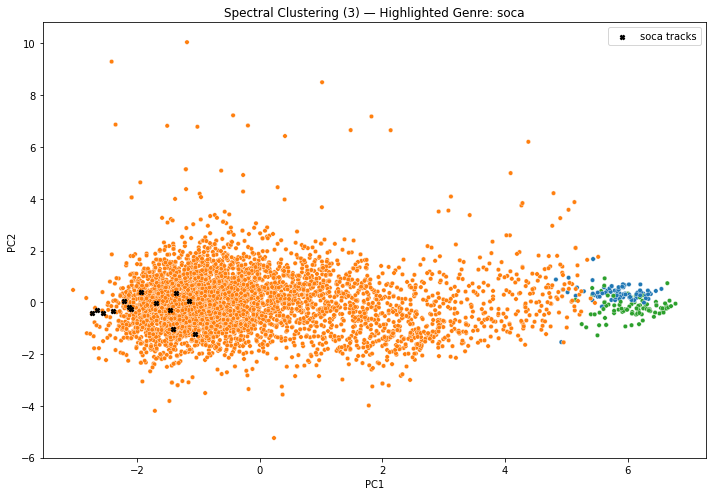

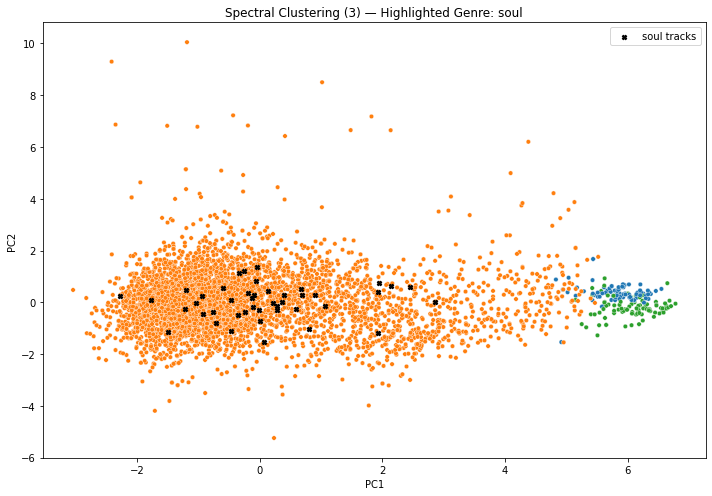

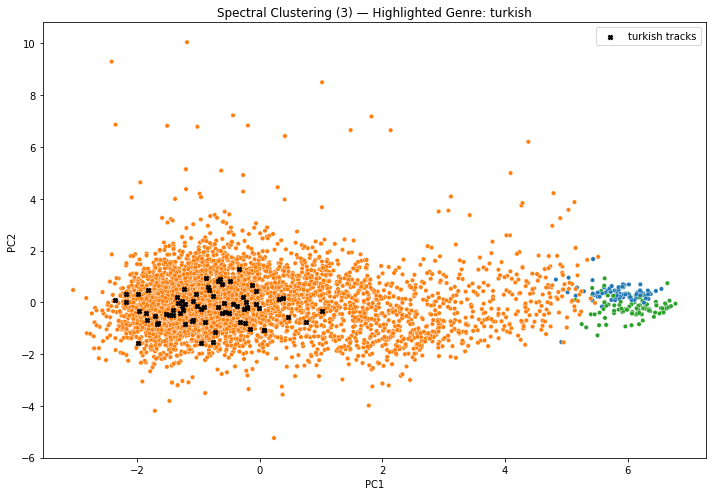

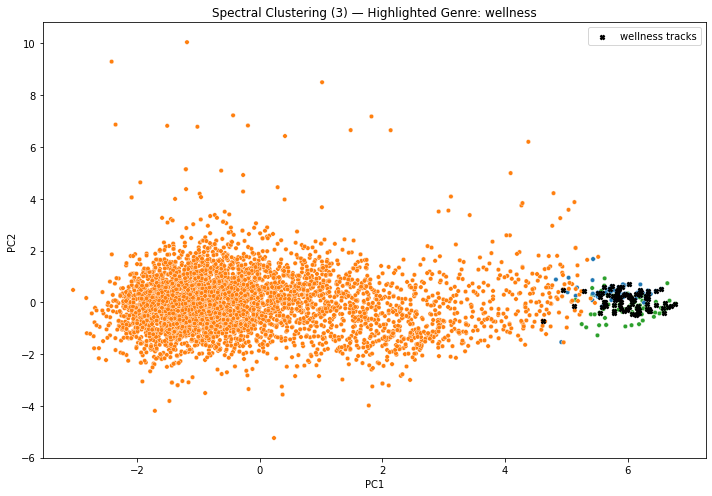

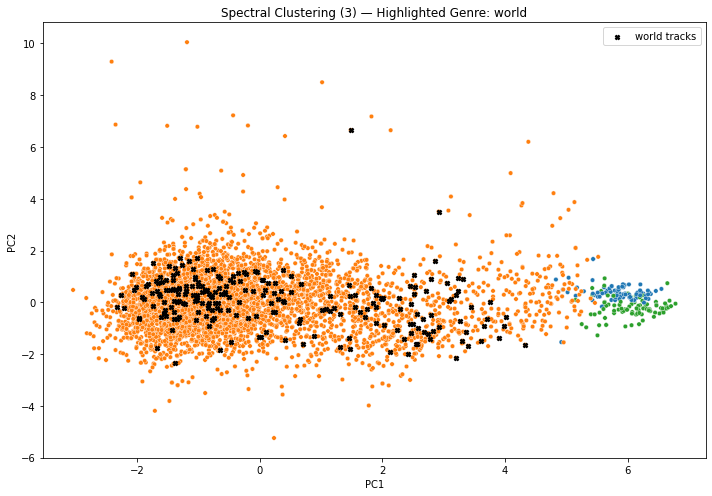

In [19]:
# DataFrame for easy plotting
plot_df = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "cluster": spec_clusters_3,
    "genre": df_clust["playlist_genre"]
})

genres = sorted(plot_df["genre"].unique())
# Colors for clusters
cluster_palette = sns.color_palette("tab10", len(np.unique(spec_clusters_3)))

#For each genre plotting the clusters and on them that specific genre points differently.
for g in genres:
    plt.figure(figsize=(10, 7))

    # Plot all points colored by cluster
    sns.scatterplot(
        data=plot_df,
        x="PC1",
        y="PC2",
        hue="cluster",
        palette=cluster_palette,
        s=20,
        legend=False
    )

    # Highlight only the corresponding genre with a special marker
    genre_points = plot_df[plot_df["genre"] == g]
    plt.scatter(
        genre_points["PC1"],
        genre_points["PC2"],
        color="black",
        s=20,
        marker="X",
        label=f"{g} tracks"
    )

    plt.title(f"Spectral Clustering (3) — Highlighted Genre: {g}")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.legend()
    plt.tight_layout()
    plt.show()

## Interpretation of Spectral Clustering (3 Clusters)

- Handles non-linear cluster shapes:
    Unlike K-Means and GMM, which assume spherical or elliptical clusters, Spectral Clustering can detect clusters with irregular, non-convex shapes—exactly the kind of structure seen in the PCA projection.

- Separates the small, distinct right-side cluster:
    In the PCA plot, Spectral Clustering successfully isolates the compact group of points on the far right which corresponds to a musically distinct subgroup (for example, high-energy afrobeats, latin). Other algorithms struggled to capture this cleanly.

- Forms one large but cohesive central cluster:
    The dense cloud in the center is grouped into a single cluster, reflecting realistic overlap between most mainstream genres. This reduces artificial splits and improves internal similarity.
    
Concluding:
- Points are significantly closer to their own cluster than to other clusters
- Cluster boundaries are far more distinct
- The algorithm has found a natural 3-part division in the audio feature landscape

# Model Selection and Evaluation

In [20]:
# Compute silhouette scores for all models
silhouette_scores = {}
silhouette_scores["KMeans (7)"] = silhouette_score(X_scaled, clusters_7)
silhouette_scores["KMeans (3)"] = silhouette_score(X_scaled, clusters_3)
silhouette_scores["HAC (7)"] = silhouette_score(X_scaled, hac_clusters_7)
silhouette_scores["HAC (3)"] = silhouette_score(X_scaled, hac_clusters_3)
silhouette_scores["GMM (7)"] = silhouette_score(X_scaled, gmm_clusters_7)
silhouette_scores["GMM (3)"] = silhouette_score(X_scaled, gmm_clusters_3)
silhouette_scores["SpectralClustering (7)"] = silhouette_score(X_scaled, spec_clusters_7)
silhouette_scores["SpectralClustering (3)"] = silhouette_score(X_scaled, spec_clusters_3)
silhouette_scores


{'KMeans (7)': 0.16900838186973663,
 'KMeans (3)': 0.2042402401222024,
 'HAC (7)': 0.135516208927953,
 'HAC (3)': 0.18365365797385327,
 'GMM (7)': 0.031645432558027445,
 'GMM (3)': 0.10427840430201464,
 'SpectralClustering (7)': 0.17615452294711803,
 'SpectralClustering (3)': 0.4079964806270577}

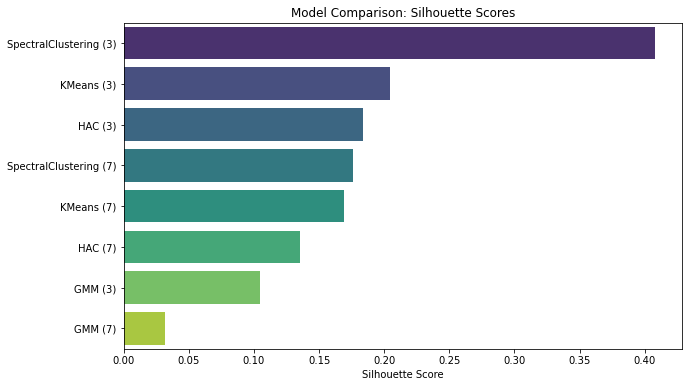

In [21]:
sil_df = pd.DataFrame.from_dict(silhouette_scores, orient='index', columns=['Silhouette'])

# Sort for a nicer visual
sil_df = sil_df.sort_values('Silhouette', ascending=False)

# Plot the silhouette scores visually
plt.figure(figsize=(10, 6))
sns.barplot(y=sil_df.index, x=sil_df['Silhouette'], palette='viridis')
plt.xlabel("Silhouette Score")
plt.title("Model Comparison: Silhouette Scores")
plt.show()

Spectral Clustering model with 3 clusters works best and the GMM model with 7 clusters works worst.

In [22]:
# Silhouette plot function
def plot_silhouette(X, labels, title):
    n_clusters = len(np.unique(labels))
    silhouette_avg = silhouette_score(X, labels)
    sample_silhouette_values = silhouette_samples(X, labels)

    plt.figure(figsize=(10, 6))
    y_lower = 10
    
    # Plot each cluster's silhouette values
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = plt.cm.Set3(i / n_clusters)
        plt.fill_betweenx(
            np.arange(y_lower, y_upper),
            0, ith_cluster_silhouette_values,
            facecolor=color, edgecolor=color, alpha=0.7
        )

        plt.text(-0.05, (y_lower + y_upper) / 2, str(i))
        y_lower = y_upper + 10

    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    plt.title(f"Silhouette Plot: {title}\nAvg silhouette = {silhouette_avg:.3f}")
    plt.xlabel("Silhouette Coefficient")
    plt.ylabel("Cluster")
    plt.tight_layout()
    plt.show()

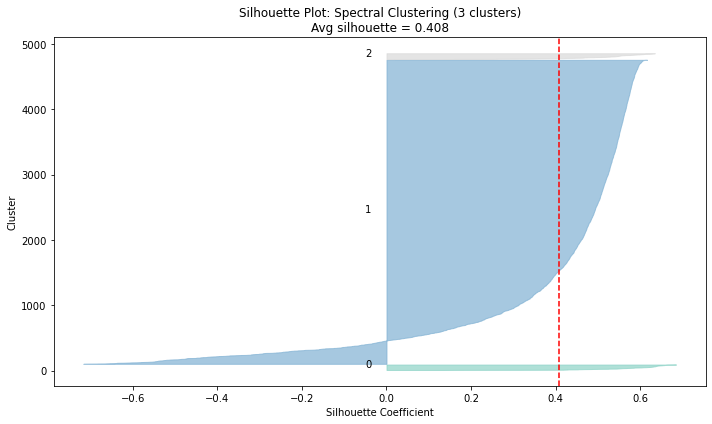

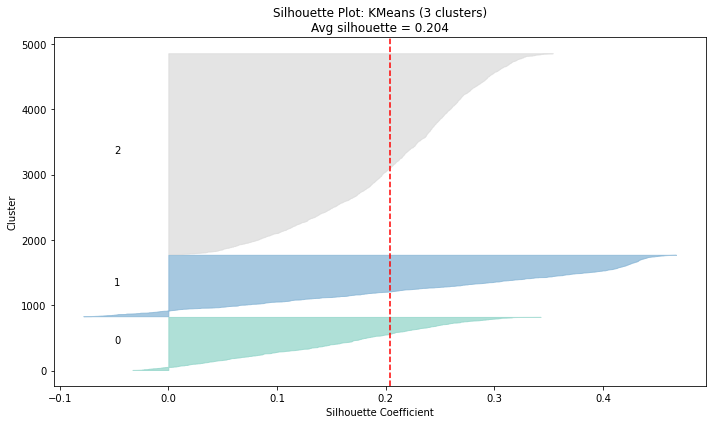

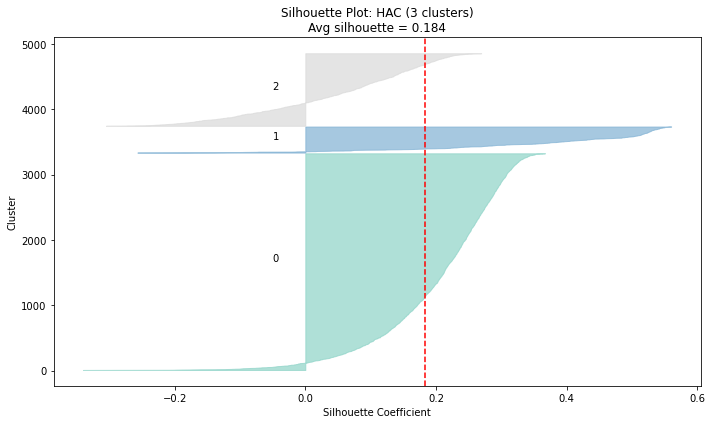

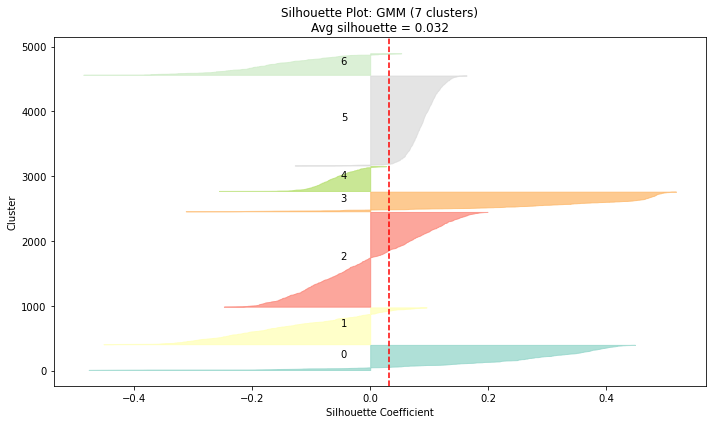

In [23]:
# Silhouette plots for different models
plot_silhouette(X_scaled, spec_clusters_3, "Spectral Clustering (3 clusters)")
plot_silhouette(X_scaled, clusters_3, "KMeans (3 clusters)")
plot_silhouette(X_scaled, hac_clusters_3, "HAC (3 clusters)")
plot_silhouette(X_scaled, gmm_clusters_7, "GMM (7 clusters)")

## Silhouette Analysis

The silhouette plots clearly show that GMM with 7 clusters performs the worst, while Spectral Clustering with 3 clusters performs the best.

- GMM (7 clusters) has an average silhouette score close to 0, meaning the clusters heavily overlap and many points are closer to other clusters than to their own. The wide spread of negative and near-zero values indicates that GMM fails to find stable or meaningful acoustic groups, and the data does not fit Gaussian-shaped clusters well.

- Spectral Clustering (3 clusters) has an average silhouette score close to 0.4 (closer to its end (0.6), meaning the clusters do not overlap heavily. The less spread of negative and near-zero values indicates that Spectral Clustering was able to find stable or meaningful acoustic groups, as the data was merged and with the graph connectiveness that Spectral Clustering works with the fact it works better makes sense.

**Overall conclusion:**

    The silhouette results confirm that Spectral Clustering (3 clusters) provides the clearest and most interpretable grouping of music tracks, while GMM (7 clusters) performs poorly and does not reflect meaningful acoustic separation in the data.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34]),
 [Text(0, 0, 'rock'),
  Text(1, 0, 'jazz'),
  Text(2, 0, 'classical'),
  Text(3, 0, 'hip-hop'),
  Text(4, 0, 'afrobeats'),
  Text(5, 0, 'latin'),
  Text(6, 0, 'indian'),
  Text(7, 0, 'lofi'),
  Text(8, 0, 'country'),
  Text(9, 0, 'soul'),
  Text(10, 0, 'j-pop'),
  Text(11, 0, 'metal'),
  Text(12, 0, 'reggae'),
  Text(13, 0, 'k-pop'),
  Text(14, 0, 'arabic'),
  Text(15, 0, 'pop'),
  Text(16, 0, 'punk'),
  Text(17, 0, 'blues'),
  Text(18, 0, 'folk'),
  Text(19, 0, 'mandopop'),
  Text(20, 0, 'cantopop'),
  Text(21, 0, 'electronic'),
  Text(22, 0, 'brazilian'),
  Text(23, 0, 'turkish'),
  Text(24, 0, 'ambient'),
  Text(25, 0, 'wellness'),
  Text(26, 0, 'gaming'),
  Text(27, 0, 'korean'),
  Text(28, 0, 'world'),
  Text(29, 0, 'gospel'),
  Text(30, 0, 'funk'),
  Text(31, 0, 'soca'),
  Text(32, 0, 'disco'),
  Text(33, 0, 'indie')

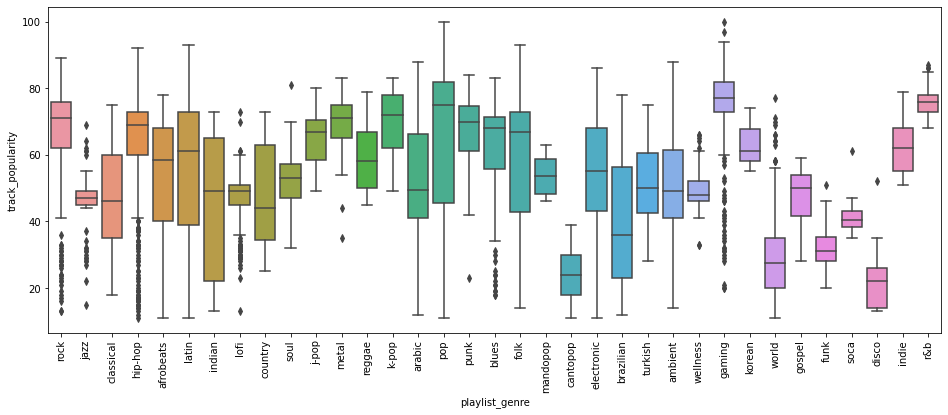

In [27]:
plt.figure(figsize=(16,6))
sns.boxplot(data=df, x='playlist_genre', y='track_popularity')
plt.xticks(rotation=90)

# Conclusion

Since track_popularity was not included in either PC1 or PC2 during dimensionality reduction, the PCA itself already suggests that popularity does not strongly influence how genres are positioned in acoustic feature space. The visualization of our best-performing model, Spectral Clustering with 3 clusters, reinforces this idea: one of the clusters is very large and contains a wide mix of genres, indicating that acoustically similar tracks do not necessarily share similar popularity levels.

The genre–popularity boxplot supports this interpretation. Most genres show wide variation in their popularity distributions, and no genre has a uniquely consistent popularity pattern. When this variability is combined with the clustering result—where many diverse genres fall within the same acoustic group—it becomes clear that acoustic clusters do not reliably predict whether a group of genres will be more or less popular.

Overall, while clustering helps uncover structural relationships between genres based on audio features, these acoustic groupings do not provide strong insight into track popularity. Popularity varies within genres and across clusters, showing that it is influenced by factors beyond the acoustic characteristics captured in our models.